# Shredding Boundaries: Data-Driven Solutions for Environmental Stewardship and Youth Empowerment through Action Sports

## Project Overview

Polluted air and water heavily impact surfers and skateboarders alike. 

In NYC, long-term exposure to PM2.5, the deadliest urban air pollutant, causes 1 in 25 deaths! <sup>1</sup> 

Rockaway Beach suffers 188% more flooding than the city average<sup>2</sup> , exposing the peninsula to fecal bacteria like Enterococci commonly found in floodwater<sup>3</sup> and eventually the ocean.


This project presents an analysis of past environmental data in areas of NYC where surfing and skateboarding are prevalent. The data was reviewed and processed for stakeholders Brujas and the Laru Beya Collective to ultimately provide recommendations on how they can maximize the impact of sustainable initiatives all while promoting cross-disciplinary cooperation and community cohesion. 

<sup>1</sup>*[Real-Time Air Quality: P](https://a816-dohbesp.nyc.gov/IndicatorPublic/data-features/realtime-air-quality/#:~:text=Long%2Dterm%20exposure%20to%20PM2,department%2C%20and%20other%20health%20threats.) by Environment and Health Data Portal*,  <sup>2</sup>[New Data Tool Shows Rockaway](https://www.rockawave.com/articles/new-data-tool-shows-rockaway-suffers-from-more-flooding-than-citywide-average/) by The Wave,  <sup>3</sup>*[Microbiological Assessment of Tap Water](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7068305/) by National Library of Medicine*

![surfer](https://d14fqx6aetz9ka.cloudfront.net/wp-content/uploads/2018/09/07161732/19a-coreywilson_moody.jpg)
Photo by Corey Wilson on [surfline.com](https://www.surfline.com/surf-news/the-surfskate-connection/34930)

![skater](https://familytraveller.com/usa/wp-content/uploads/sites/2/2019/03/sky-brown-skating-1.jpg)
Photo by Anton Nilsson on [familytraveller.com](https://familytraveller.com/usa/vacation-destinations/asia/sky-brown-olympic-skateboarder/)

## Business Problem

The Laru Beya Collective and Brujas are looking to merge the waves of surf culture with the streets of skateboarding, uniting their communities under a singular banner of action sports and environmental stewardship.
They tasked me with looking into New York City's Beach Water Samples dataset and the city's Air Quality dataset.  The company wants to know:


1. What areas of the city put skateboarders most at risk to environmental hazards? 

2. What areas of the beach put surfers most at risk to environmental hazards? 

3. How can we use the insights from the project to organically foster cross-disciplinary cooperation and community cohesion?

4. How can we use our platform to amplify outreach and make a tangible impact on both environmental conservation and social empowerment within communities?

## Data Understanding

The two datasets used throughout the project are provided by the Department of Health and Mental Hygiene through the New York City Open Data website. That includes:

- Beach Water Samples dataset from 2005 to 2023
- Dataset contains the Enterococci bacteria measurements from the beach water samples collected
- Entire dataset contains 26,999 records and 6 columns

- Air Quality dataset from 2008 to 2022
- Dataset contains the measurements for air pollutant, fine particles (PM 2.5), for each tested area of the city
- Entire dataset contains 18,025 records and 12 columns

## Data Analysis

Let's explore the processes done on the dataset.
- Data Preparation
- Data Cleaning
- Data Model Progression
- Model Evaluation
- Data Visualization

### Data Preparation (Beach Water Samples)

In this section:

- The necessary python libraries are imported and read through
- The .tail() is used to show a sample of the data we are working with

In [1]:
# Import necessary packages for entire Jupyter Notebook

import pandas as pd
import numpy as np
import warnings
import itertools
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.holtwinters import ExponentialSmoothing


# Suppress warnings
warnings.filterwarnings("ignore")

In [2]:
# Load and read in the 'Beach_Water_Samples_20240530' dataset

beach_water_samples = pd.read_csv("Data/Beach_Water_Samples_20240530.csv")
beach_water_samples

,Sample ID,Sample Date,Beach Name,Sample Location,Enterococci Results,Units or Notes
0,050514CP13,05/05/2014,MIDLAND BEACH,Center,20.0,MPN/100 ml
1,062011GR04,06/20/2011,MANHATTAN BEACH,Left,NaN,Result below detection limit
2,072808BH09,07/28/2008,MIDLAND BEACH,Right,28.0,MPN/100 ml
3,051214CP36,05/12/2014,SOUTH BEACH,Right,4.0,MPN/100 ml
4,081511KB07,08/15/2011,CEDAR GROVE,Left,360.0,MPN/100 ml
...,...,...,...,...,...,...
26994,JB2309130955-1.3,09/13/2023,DANISH AMERICAN BEACH CLUB,Right,132.0,MPN/100 ml
26995,KB2309130925-1.2,09/13/2023,DOUGLASTON HOMEOWNERS ASSOCIATION,Center,97.0,MPN/100 ml
26996,JB2309131100-1.3,09/13/2023,MORRIS YACHT AND BEACH CLUB,Right,96.0,MPN/100 ml
26997,JB2309131100-1.2,09/13/2023,MORRIS YACHT AND BEACH CLUB,Center,158.0,MPN/100 ml


In [3]:
beach_water_samples.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26999 entries, 0 to 26998
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Sample ID            26999 non-null  object 
 1   Sample Date          26999 non-null  object 
 2   Beach Name           26999 non-null  object 
 3   Sample Location      26962 non-null  object 
 4   Enterococci Results  19554 non-null  float64
 5   Units or Notes       26999 non-null  object 
dtypes: float64(1), object(5)
memory usage: 1.2+ MB


### Data Cleaning (Beach Water Samples)

Overall steps for this section:

- Check for duplicates
- Filter raw data by relevancy to business problem
- Address missing values
- Keep columns necessary to answer business problem

Justifications for filtering raw data:

- The Laru Beya Collective is interested in the last three years of the beach water samples dataset in order to address the areas where the Entercocci bacteria is still the most present
- The youth organization is only interested in regions that concern Rockaway beach because that is the only surfable beach in all five boroughs of the city. 

In [4]:
# Remove default value so as to view entire dataset
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Reset the maximum number of rows and columns to their default values
# Uncomment the following lines if you want to revert back to default values
# pd.reset_option('display.max_rows')
# pd.reset_option('display.max_columns')

In [5]:
# Dropping columns that are not relevant to business problem

beach_water_samples.drop(columns=['Sample ID', 'Sample Location'], inplace=True)

# Convert the 'Sample Date' column to datetime format
beach_water_samples['Sample Date'] = pd.to_datetime(beach_water_samples['Sample Date'], format='%m/%d/%Y')

# Filter data for dates on or after January 1, 2020
filtered_beach_water_samples = beach_water_samples[beach_water_samples['Sample Date'] >= '2020-01-01']

# Drop rows with missing 'Enterococci Results'
filtered_beach_water_samples = filtered_beach_water_samples.dropna(subset=['Enterococci Results'])

# Only keep rows with 'Beach Name' containing 'ROCKAWAY' in any form
filtered_beach_water_samples = filtered_beach_water_samples[filtered_beach_water_samples['Beach Name'].str.contains('ROCKAWAY')]

# Sort data by 'Sample Date'column so as to display the Enterococci 
# bacteria levels chronologically for a given area of the beach
filtered_beach_water_samples.sort_values(by='Sample Date', ascending=True, inplace=True)

# Rename 'Enterococci Results' column for consistency
beach_water_samples_master_data = filtered_beach_water_samples.rename(columns={'Enterococci Results': 'Enterococci_Results'})

# Display the final DataFrame
# Looking at tail end of dataset so as to inspect most recent data
beach_water_samples_master_data = filtered_beach_water_samples
beach_water_samples_master_data

,Sample Date,Beach Name,Enterococci Results,Units or Notes
23329,2020-06-18,ROCKAWAY BEACH 116TH - 126TH,8.0,MPN/100 ml
23389,2020-06-29,ROCKAWAY BEACH 15TH - 22TH,68.0,MPN/100 ml
23296,2020-07-13,ROCKAWAY BEACH 9TH - 13TH,8.0,MPN/100 ml
23416,2020-07-13,ROCKAWAY BEACH 80TH - 95TH,4.0,MPN/100 ml
23468,2020-07-27,ROCKAWAY BEACH 15TH - 22TH,4.0,MPN/100 ml
23486,2020-07-27,ROCKAWAY BEACH 95TH - 116TH,4.0,MPN/100 ml
23515,2020-08-11,ROCKAWAY BEACH 80TH - 95TH,12.0,MPN/100 ml
23526,2020-08-11,ROCKAWAY BEACH 116TH - 126TH,4.0,MPN/100 ml
23538,2020-08-11,ROCKAWAY BEACH 9TH - 13TH,20.0,MPN/100 ml
23576,2020-08-24,ROCKAWAY BEACH 95TH - 116TH,4.0,MPN/100 ml


#### Highest levels of Enterococci 


5/3/23
ROCKAWAY BEACH 9th-13th - 20.0

7/26/23
ROCKAWAY BEACH 15TH - 22TH - 41.0
ROCKAWAY BEACH 9TH - 13TH - 97.0

9/7/23
ROCKAWAY BEACH 23RD - 59TH- 30.0
ROCKAWAY BEACH 116TH - 126TH - 20.0

5/18/22
ROCKAWAY BEACH 126TH - 149TH - 87.0
ROCKAWAY BEACH 116TH - 126TH - 20.0
ROCKAWAY BEACH 9TH - 13TH - 31.0

8/26/21. 
ROCKAWAY BEACH 23rd - 59th  - 20.0

8/11/21
ROCKAWAY BEACH 15TH - 22TH - 478.0

In [6]:
# Check changes were implemented
beach_water_samples_master_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 202 entries, 23329 to 26980
Data columns (total 4 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Sample Date          202 non-null    datetime64[ns]
 1   Beach Name           202 non-null    object        
 2   Enterococci Results  202 non-null    float64       
 3   Units or Notes       202 non-null    object        
dtypes: datetime64[ns](1), float64(1), object(2)
memory usage: 7.9+ KB


The size of the dataset used in the analysis after cleaning it is now 202 entries with 4 columns.

### Data Model Progession (Beach Water Samples)

In [7]:
# Baseline model for beach water samples master data: Shift(1) model 

# Create Shift(1) column for baseline model
beach_water_samples_master_data['Shift(1)'] = beach_water_samples_master_data['Enterococci Results'].shift(1)

# Split the data into training and testing sets
train_data = beach_water_samples_master_data.iloc[:161]
test_data = beach_water_samples_master_data.iloc[161:]

# Display the dataset to confirm the model is applied correctly
combined_beach_water_samples_master_data = pd.concat([train_data, test_data])
combined_beach_water_samples_master_data[['Sample Date','Beach Name','Enterococci Results','Shift(1)','Units or Notes']].tail(20)

,Sample Date,Beach Name,Enterococci Results,Shift(1),Units or Notes
26707,2023-08-10,ROCKAWAY BEACH 23RD - 59TH,9.9,9.9,MPN/100 ml
26711,2023-08-10,ROCKAWAY BEACH 9TH - 13TH,10.0,9.9,MPN/100 ml
26721,2023-08-10,ROCKAWAY BEACH 95TH - 116TH,9.9,10.0,MPN/100 ml
26738,2023-08-10,ROCKAWAY BEACH 116TH - 126TH,10.0,9.9,MPN/100 ml
26858,2023-08-23,ROCKAWAY BEACH 9TH - 13TH,9.9,10.0,MPN/100 ml
26854,2023-08-23,ROCKAWAY BEACH 23RD - 59TH,9.9,9.9,MPN/100 ml
26842,2023-08-23,ROCKAWAY BEACH 59TH - 80TH,9.9,9.9,MPN/100 ml
26837,2023-08-23,ROCKAWAY BEACH 126TH - 149TH,9.9,9.9,MPN/100 ml
26823,2023-08-23,ROCKAWAY BEACH 116TH - 126TH,9.9,9.9,MPN/100 ml
26825,2023-08-23,ROCKAWAY BEACH 15TH - 22TH,10.0,9.9,MPN/100 ml


In [8]:
# First simple model for beach water samples master data: Simple Exponential Smoothing (SES) 

# SES Model
simple_exp_model_beach = SimpleExpSmoothing(train_data['Enterococci Results']).fit()

# Forecast using the SES model
simple_exp_predictions_beach = simple_exp_model_beach.forecast(len(test_data))

In [9]:
# Prep for final model for beach water samples master data: AutoRegressive Integrated Moving Average (ARIMA)

#Grid search for ARIMA parameters
best_mse = float("inf")
best_order = (0, 0, 0)

# Iterate over a range of p, d, q values for ARIMA
for p in range(5):  
    for d in range(3):
        for q in range(5):
            try:
                # Fit the ARIMA model
                model = ARIMA(train_data['Enterococci Results'], order=(p, d, q)).fit()

                # Forecast using the ARIMA model
                predictions = model.forecast(len(test_data))

                # Calculate the MSE for the ARIMA model
                mse = mean_squared_error(test_data['Enterococci Results'], predictions)

                # Update the best order and MSE if current model is better
                if mse < best_mse:
                    best_mse = mse
                    best_order = (p, d, q)
            except Exception as e:
                continue

print(f"Best ARIMA Model Order: {best_order} with MSE: {best_mse}")

# Fit the best ARIMA model
best_arima_model = ARIMA(train_data['Enterococci Results'], order=best_order).fit()

# Forecast using the best ARIMA model
arima_predictions = best_arima_model.forecast(len(test_data))

Best ARIMA Model Order: (3, 1, 4) with MSE: 202.58285876635503


### Model Evaluation (Beach Water Samples)

In [10]:
# Shift(1) Model MSE evaluation
shift1_mse = mean_squared_error(test_data['Enterococci Results'], test_data['Shift(1)'])
print(f"Shift(1) Model MSE (Beach Water): {shift1_mse}")

# MSE for the SES model
simple_exp__beach_mse = mean_squared_error(test_data['Enterococci Results'], simple_exp_predictions_beach)
print(f"Simple Exponential Smoothing Model MSE (Beach Water): {simple_exp__beach_mse}")


# Calculate the MSE for the best ARIMA model
arima_mse = mean_squared_error(test_data['Enterococci Results'], arima_predictions)
print(f"Best ARIMA Model MSE (Beach Water): {arima_mse}")

Shift(1) Model MSE (Beach Water): 437.0575609756097
Simple Exponential Smoothing Model MSE (Beach Water): 208.66761016513564
Best ARIMA Model MSE (Beach Water): 202.58285876635503


### Data Visualization (Beach Water Samples)

Create a visual that:

- Plots the final model including data from the last available year 
- Shows the forecasted prediction for the following year

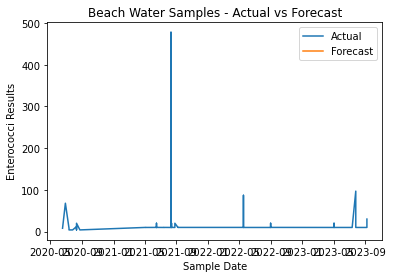

In [12]:
# Use the forecast() method to generate predictions for the following year
arima_predictions = best_arima_model.forecast(365)

# Create a new DataFrame to store the forecasted values
forecast_df = pd.DataFrame(arima_predictions, columns=['Forecast'])

# Append the forecast DataFrame to the original dataset
beach_water_samples_with_forecast = pd.concat([beach_water_samples_master_data, forecast_df], axis=0)

# Plot the actual data and the forecasted values
plt.plot(beach_water_samples_with_forecast['Sample Date'], beach_water_samples_with_forecast['Enterococci Results'], label='Actual')
plt.plot(beach_water_samples_with_forecast['Sample Date'], beach_water_samples_with_forecast['Forecast'], label='Forecast')
plt.xlabel('Sample Date')
plt.ylabel('Enterococci Results')
plt.title('Beach Water Samples - Actual vs Forecast')
plt.legend()
plt.show()

Key Take Away:

- From the plot above you can see that the Enterococci bacteria levels in the beach water exhibit a seasonal pattern. 
- The levels tend to increase during the summer months, peaking in July and August, and decrease during the winter months. 
- This pattern suggests a correlation between higher bacteria levels and warmer weather, which could be due to factors such as increased beach attendance or environmental conditions favorable for bacteria growth. 
- Understanding this seasonality can be valuable for beach management and public health initiatives, as it allows for targeted interventions and monitoring during periods of higher risk.

### Data Preparation (Air Quality)

In [13]:
# Load and read in the 'Air_Quality_20240530' dataset
air_quality = pd.read_csv("Data/Air_Quality_20240530.csv")
air_quality

,Unique ID,Indicator ID,Name,Measure,Measure Info,Geo Type Name,Geo Join ID,Geo Place Name,Time Period,Start_Date,Data Value,Message
0,179772,640,Boiler Emissions- Total SO2 Emissions,Number per km2,number,UHF42,409.0,Southeast Queens,2015,01/01/2015,0.3,NaN
1,179785,640,Boiler Emissions- Total SO2 Emissions,Number per km2,number,UHF42,209.0,Bensonhurst - Bay Ridge,2015,01/01/2015,1.2,NaN
2,178540,365,Fine particles (PM 2.5),Mean,mcg/m3,UHF42,209.0,Bensonhurst - Bay Ridge,Annual Average 2012,12/01/2011,8.6,NaN
3,178561,365,Fine particles (PM 2.5),Mean,mcg/m3,UHF42,409.0,Southeast Queens,Annual Average 2012,12/01/2011,8.0,NaN
4,823217,365,Fine particles (PM 2.5),Mean,mcg/m3,UHF42,409.0,Southeast Queens,Summer 2022,06/01/2022,6.1,NaN
5,177910,365,Fine particles (PM 2.5),Mean,mcg/m3,UHF42,209.0,Bensonhurst - Bay Ridge,Summer 2012,06/01/2012,10.0,NaN
6,177952,365,Fine particles (PM 2.5),Mean,mcg/m3,UHF42,209.0,Bensonhurst - Bay Ridge,Summer 2013,06/01/2013,9.8,NaN
7,177973,365,Fine particles (PM 2.5),Mean,mcg/m3,UHF42,409.0,Southeast Queens,Summer 2013,06/01/2013,9.8,NaN
8,177931,365,Fine particles (PM 2.5),Mean,mcg/m3,UHF42,409.0,Southeast Queens,Summer 2012,06/01/2012,9.6,NaN
9,742274,365,Fine particles (PM 2.5),Mean,mcg/m3,UHF42,410.0,Rockaways,Summer 2021,06/01/2021,7.2,NaN


In [14]:
air_quality.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18025 entries, 0 to 18024
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unique ID       18025 non-null  int64  
 1   Indicator ID    18025 non-null  int64  
 2   Name            18025 non-null  object 
 3   Measure         18025 non-null  object 
 4   Measure Info    18025 non-null  object 
 5   Geo Type Name   18025 non-null  object 
 6   Geo Join ID     18016 non-null  float64
 7   Geo Place Name  18016 non-null  object 
 8   Time Period     18025 non-null  object 
 9   Start_Date      18025 non-null  object 
 10  Data Value      18025 non-null  float64
 11  Message         0 non-null      float64
dtypes: float64(3), int64(2), object(7)
memory usage: 1.7+ MB


### Data Cleaning (Air Quality)

Overall steps for this section:

- Check for duplicates
- Filter raw data by relevancy to business problem
- Address missing values
- Keep columns necessary to answer business problem

Justifications for filtering raw data:

- Brujas is interested in the last three years of the air quality dataset in order to address the areas where the pollutants are still the most present.
- The youth organization is interested in data from all five boroughs of the city.
- The youth organziation wanted to target the most hazardouse air pollutant which is PM 2.5

In [15]:
# Clean data (preprocessing)

# Drop columns that are not relevant to business problem 
columns_to_drop = ['Unique ID', 'Indicator ID', 'Measure', 'Geo Type Name', 'Geo Join ID', 'Time Period', 'Message']
air_quality.drop(columns=columns_to_drop, inplace=True)

# Rename column by re-assigning
air_quality = air_quality.rename(columns={'Start_Date': 'Start Date'})
air_quality = air_quality.rename(columns={'Name': 'Air Pollutant Name'})


# Filter for air pollutant name 'Fine particles (PM 2.5)' and create a copy
filtered_air_quality = air_quality.loc[air_quality['Air Pollutant Name'] == 'Fine particles (PM 2.5)'].copy()

# Convert the "Start Date" column to datetime format directly using 'copy'
filtered_air_quality['Start Date'] = pd.to_datetime(filtered_air_quality['Start Date'], format='%m/%d/%Y')

# Filter for dates on or after December 1, 2019
filtered_air_quality = filtered_air_quality[filtered_air_quality['Start Date'] >= '2019-12-01']

# Sort the DataFrame by the 'Start Date' column so as to 
# display the PM 2.5 levels chronologically for a given area
filtered_air_quality.sort_values(by='Start Date', ascending=True, inplace=True)

# Assign to master data
air_quality_master_data = filtered_air_quality
air_quality_master_data

,Air Pollutant Name,Measure Info,Geo Place Name,Start Date,Data Value
14562,Fine particles (PM 2.5),mcg/m3,Rockaways,2019-12-01,6.1
9959,Fine particles (PM 2.5),mcg/m3,Crown Heights and Prospect Heights (CD8),2019-12-01,8.0
9868,Fine particles (PM 2.5),mcg/m3,South Beach and Willowbrook (CD2),2019-12-01,6.9
9867,Fine particles (PM 2.5),mcg/m3,St. George and Stapleton (CD1),2019-12-01,7.4
2889,Fine particles (PM 2.5),mcg/m3,East New York,2019-12-01,7.4
9641,Fine particles (PM 2.5),mcg/m3,South Beach - Tottenville,2019-12-01,6.1
3017,Fine particles (PM 2.5),mcg/m3,Manhattan,2019-12-01,9.1
9556,Fine particles (PM 2.5),mcg/m3,Greenpoint,2019-12-01,8.6
3030,Fine particles (PM 2.5),mcg/m3,Central Harlem (CD10),2019-12-01,7.5
3034,Fine particles (PM 2.5),mcg/m3,Bay Ridge and Dyker Heights (CD10),2019-12-01,7.8


#### Highest levels of PM 2.5 in 2022


1/1/22 9.1 
Midtown (CD5)

1/1/22 8.4 
Chelsea - Clinton
Greenwich Village and Soho

1/1/22 8.3 
Chelsea-Village

6/1/2022, 8.3 
Chelsea - Clinton

6/1/2022, 8.2 
Chelsea-Village

6/1/2022, 8.0
Clinton and Chelsea (CD4)
Greenwich Village - SoHo
Gramercy Park - Murray Hill

In [16]:
# Check changes were implemented
air_quality_master_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1269 entries, 14562 to 4
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Air Pollutant Name  1269 non-null   object        
 1   Measure Info        1269 non-null   object        
 2   Geo Place Name      1269 non-null   object        
 3   Start Date          1269 non-null   datetime64[ns]
 4   Data Value          1269 non-null   float64       
dtypes: datetime64[ns](1), float64(1), object(3)
memory usage: 59.5+ KB


The size of the dataset used in the analysis after cleaning it is now 1,269 entries with 5 columns.

### Data Model Progession (Air Quality)

In [17]:
# Baseline model for air quality master data: Shift(1) model 
air_quality_master_data['Shift(1)'] = air_quality_master_data['Data Value'].shift(1)

# Split data into training and testing sets
train_size = int(len(air_quality_master_data) * 0.8)
train_air_quality = air_quality_master_data.iloc[:train_size].copy()
test_air_quality = air_quality_master_data.iloc[train_size:].copy()

# Display the dataset to confirm the model is applied correctly
# Looking at tail end of dataset so as to inspect most recent data
combined_air_quality_data = pd.concat([train_air_quality, test_air_quality])
combined_air_quality_data[['Start Date','Geo Place Name','Air Pollutant Name','Data Value','Shift(1)','Measure Info']].tail(20)

,Start Date,Geo Place Name,Air Pollutant Name,Data Value,Shift(1),Measure Info
6799,2022-06-01,Borough Park,Fine particles (PM 2.5),6.2,5.9,mcg/m3
6580,2022-06-01,Coney Island - Sheepshead Bay,Fine particles (PM 2.5),5.8,6.2,mcg/m3
6344,2022-06-01,Northern SI,Fine particles (PM 2.5),6.0,5.8,mcg/m3
6342,2022-06-01,Williamsburg - Bushwick,Fine particles (PM 2.5),7.0,6.0,mcg/m3
6324,2022-06-01,East Flatbush (CD17),Fine particles (PM 2.5),6.2,7.0,mcg/m3
6321,2022-06-01,Morrisania and Crotona (CD3),Fine particles (PM 2.5),7.2,6.2,mcg/m3
6319,2022-06-01,Elmhurst and Corona (CD4),Fine particles (PM 2.5),6.8,7.2,mcg/m3
6318,2022-06-01,Bedford Stuyvesant (CD3),Fine particles (PM 2.5),6.7,6.8,mcg/m3
6317,2022-06-01,Lower East Side and Chinatown (CD3),Fine particles (PM 2.5),7.4,6.7,mcg/m3
15764,2022-06-01,New York City,Fine particles (PM 2.5),6.4,7.4,mcg/m3


In [18]:
# First Simple Model for air quality master data :  Simple Exponential Smoothing (SES) Model

# Apply SES model
ses_model = SimpleExpSmoothing(train_air_quality['Data Value']).fit()
ses_predictions = ses_model.forecast(len(test_air_quality))

In [19]:
# Final model: Seasonal AutoRegressive Integrated Moving Average (SARIMA)

# Apply SARIMA model
best_sarima_order = (2, 1, 2)
seasonal_order = (1, 0, 1, 12)

sarima_model = SARIMAX(train_air_quality['Data Value'], order=best_sarima_order, seasonal_order=seasonal_order)
sarima_fit = sarima_model.fit(disp=False)
sarima_predictions = sarima_fit.forecast(steps=len(test_air_quality))

### Model Evaluation (Air Quality)

In [20]:
# Calculate MSE for Shift(1) Model
shift1_mse = mean_squared_error(test_air_quality['Data Value'], test_air_quality['Shift(1)'])

# Calculate MSE for SES
ses_mse = mean_squared_error(test_air_quality['Data Value'], ses_predictions)

# Calculate MSE for SARIMA
sarima_mse = mean_squared_error(test_air_quality['Data Value'], sarima_predictions)

# Print MSE scores
print(f"Shift(1) Model MSE (Air Quality): {shift1_mse}")
print(f"SES Model MSE (Air Quality): {ses_mse}")
print(f"Best SARIMA Model MSE (Air Quality): {sarima_mse}")

Shift(1) Model MSE (Air Quality): 0.7820472440944881
SES Model MSE (Air Quality): 0.6361898834438272
Best SARIMA Model MSE (Air Quality): 0.48721715999180953


### Data Visualization (Air Quality)

Create a visual that:

- Plots the final model including data from the last available year 
- Shows the forecasted prediction for the following year

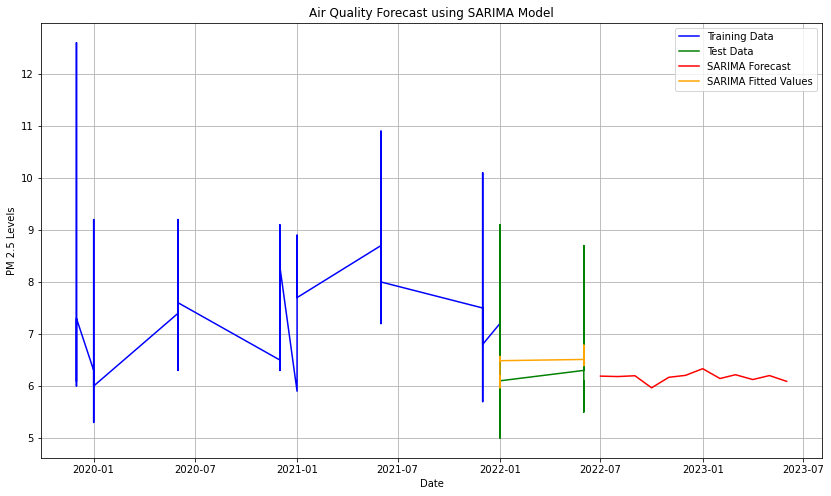

In [21]:
# Forecast for the following year using the SARIMA model
forecast_steps = 12  # Number of months to forecast
sarima_forecast = sarima_fit.get_forecast(steps=forecast_steps)
forecast_index = pd.date_range(start=test_air_quality['Start Date'].iloc[-1], periods=forecast_steps+1, freq='MS')[1:]

# Create a DataFrame for the forecasted values
forecasted_values = sarima_forecast.predicted_mean
forecasted_data = pd.DataFrame({'Start Date': forecast_index, 'Forecasted Data Value': forecasted_values})

# Plot the actual data and the forecast
plt.figure(figsize=(14, 8))

# Plot training data
plt.plot(train_air_quality['Start Date'], train_air_quality['Data Value'], label='Training Data', color='blue')

# Plot test data
plt.plot(test_air_quality['Start Date'], test_air_quality['Data Value'], label='Test Data', color='green')

# Plot SARIMA forecast
plt.plot(forecasted_data['Start Date'], forecasted_data['Forecasted Data Value'], label='SARIMA Forecast', color='red')

# Plot the fitted values on the test data
plt.plot(test_air_quality['Start Date'], sarima_predictions, label='SARIMA Fitted Values', color='orange')

# Customize the plot
plt.xlabel('Date')
plt.ylabel('PM 2.5 Levels')
plt.title('Air Quality Forecast using SARIMA Model')
plt.legend()
plt.grid(True)

# Show the plot
plt.show()

Key Take aways: 

1. Model Fit:
    * The yellow-orange line (SARIMA fitted values) closely matches the green line (test data), demonstrating that the model accurately captures the behavior of the air quality data during the test period. This indicates a strong model fit.
2. Future Predictions:
    * The red line (SARIMA forecast) extends the trends observed in the historical data into the future. This suggests that the SARIMA model's predictions for the upcoming year are reliable and follow expected seasonal variations.
3. Actionable Insights:
    * The forecasted data can be used to anticipate periods of high or low air quality, allowing for proactive measures to be taken to mitigate potential health impacts.

## Conclusion

### Air Quality

- The highest concentrations of PM 2.5 are all found in the Manhattan borough

-  Midtown and Chelsea put skateboarders the most at risk because those areas had the highest levels of PM 2.5 in all of NYC in 2022 

- Winter yielded higher concentrations of PM 2.5 than summer samples


### Beach Water Samples


- The highest concentrations of Enterococci bacteria are found in ROCKAWAY BEACH 9TH - 13TH in the July 28 2023 sample intake

- The second highest concentrations of Enterococci bacteria are found in ROCKAWAY BEACH 15TH - 22TH in the July 28 2023 sample intake

- The third highest concentrations of Enterococci bacteria in 2023 are found in ROCKAWAY BEACH 23RD - 59TH in the September 7 2023 sample intake

- 9th street to 59th street put surfers the most at risk because those areas had the highest levels of Enterococci bacteria in all of Rockaway Beach in 2023

###### Note: Any skepticism in the data is mainly due to the lack of year round sample collection.
###### Also important to note that the Air Quality dataset provided data only up until 2022.

### Recommendations

1. Brujas: Consider using your social media platform to enlighten the community of the evnironmental dangers posed to urban skateboarders. A color coded map that highlights the areas with the highest concentrations of PM 2.5 could make it easier for people to engage with the content. 

2. Laru Beya: Organize beach clean ups in targeted areas of the beach and the time of the year when they are the most polluted. 

3. Brujas + Laru Beya: Host a surf skate workshop with the goal of empowerment through knowledge.  Environmental component:Frame air and water quality information as a tool for personal empowerment rather than a set of rules. Explain how air pollution and water contamination affects the body during intense physical activities especially for surfers and skateboarders who are in those environments for long periods of time. Highlight how understanding air and water quality can help them make informed decisions about when and where to skate and/or surf to maximize their performance and reduce the risk of discomfort or health issues. Action sports component: surfers teach skaters how to surf and skaters teach surfers how to skate. Swap skills, make new connections, strengthen the community.

4. Laru Beya + Brujas: Forge dynamic partnerships outsisde the surf/skate community: Brujas partner with NY Restoration Project (tree planting organization) and host tree planting events, Laru Beya partner with local schools/organizations near the most affected areas of the beach and offer educational talks regarding the project's findings. The goal? Equip the youth with knowledge so they can enhance their urban resilience to climate change. 

### Next Steps

1. Conduct a comprehensive assessment and impact analysis of each youth organization (Brujas + Laru Beya). Track the project's effectiveness by monitoring key indicators such as youth engagement, environmental actions, community partnerships, and participant feedback. Use these insights to refine strategies and drive continuous improvement.

2. Develop an advanced model that integrates the project’s environmental data with the organization’s assessment and impact analysis. This model will deeply explore and enhance the critical connections between action sports, environmental stewardship, and youth empowerment, solidifying and amplifying their mutual impact.

3. As surf and skate organizations that frequently travel, consider expanding this project to other cities. I can adapt the project to suit regional environmental conditions and community needs. Conducting thorough analysis of your next destination will yield valuable data and foster new partnerships with environmental advocates, surf, and skate communities worldwide.